#Dataset Setup

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df = pd.read_csv('/content/drive/MyDrive/ERP Coding/【interest decoded】all_nonunique_visitor_pathinteractions_statevalues.csv', encoding='latin-1', on_bad_lines='skip')

In [ ]:
df

,visitor_id,datetime,installation,state
0,6593cfd44cc1c34edc012514,2024/1/2 8:58,mobile-app-api,"('Zapp', ['Drama', 'Komedie', 'Oorlog'])"
1,6593cfd44cc1c34edc012514,2024/1/2 8:59,mobile-app-api,"('Interest', ['Muziek', 'Thuis en familie', 'M..."
2,6593cfd44cc1c34edc012514,2024/1/2 9:00,Fotostoel,"('visitorProfileImageTransformation', [])"
3,6593cfd44cc1c34edc012514,2024/1/2 9:10,Delen verboden,"('visitorProfileImageTransformation', [])"
4,6593cfd44cc1c34edc012514,2024/1/2 9:10,Delen verboden,"('DelenVerbodenResult', {'correct': 0, 'incorr..."
...,...,...,...,...
709691,6630f4195d21726d240e2a8d,2024/4/30 13:41,mobile-app-api,"('Sport', [])"
709692,6630f4195d21726d240e2a8d,2024/4/30 13:41,mobile-app-api,"('Interest', ['Lifestyle', 'Thuis en familie',..."
709693,6630f4195d21726d240e2a8d,2024/4/30 13:41,mobile-app-api,"('Sport', ['Watersport'])"
709694,6630f4195d21726d240e2a8d,2024/4/30 13:42,Fotostoel,"('visitorProfileImageTransformation', [])"


# Data Cleaning

In [ ]:
#Find out unique installation numbers
unique_installation_list = df['installation'].unique()
unique_installation_list = pd.DataFrame(unique_installation_list)
unique_installation_list

,0
0,mobile-app-api
1,Fotostoel
2,Delen verboden
3,De wereld binnen handbereik
4,Reaguurders
5,Codetaal
6,Maak het sportnieuws
7,Maak het shownieuws
8,Filterbubbel
9,Serieus grappig


In [ ]:
#Preprocess 'state' column --> state_type + state_value
import ast
df_state = df.copy()

def parse_state(state_str):
    try:
        return ast.literal_eval(state_str)
    except:
        return None

df_state['parsed_state'] = df_state['state'].apply(parse_state)
df_state['parsed_state']

,parsed_state
0,"(Zapp, [Drama, Komedie, Oorlog])"
1,"(Interest, [Muziek, Thuis en familie, Mediageb..."
2,"(visitorProfileImageTransformation, [])"
3,"(visitorProfileImageTransformation, [])"
4,"(DelenVerbodenResult, {'correct': 0, 'incorrec..."
...,...
709691,"(Sport, [])"
709692,"(Interest, [Lifestyle, Thuis en familie, Sport])"
709693,"(Sport, [Watersport])"
709694,"(visitorProfileImageTransformation, [])"


In [ ]:
#Extract 'state_type' column
df_state['state_type'] = df_state['parsed_state'].apply(lambda x: x[0] if isinstance(x, tuple) and len(x) > 0 else None)
df_state['state_value'] = df_state['parsed_state'].apply(lambda x: x[1] if isinstance(x, tuple) and len(x) > 1 else None)
df_state['state_type']

,state_type
0,Zapp
1,Interest
2,visitorProfileImageTransformation
3,visitorProfileImageTransformation
4,DelenVerbodenResult
...,...
709691,Sport
709692,Interest
709693,Sport
709694,visitorProfileImageTransformation


In [ ]:
#Extract 'state_value'
df_state['state_value']

,state_value
0,"[Drama, Komedie, Oorlog]"
1,"[Muziek, Thuis en familie, Mediagebruik]"
2,[]
3,[]
4,"{'correct': 0, 'incorrect': 3, 'total': 3}"
...,...
709691,[]
709692,"[Lifestyle, Thuis en familie, Sport]"
709693,[Watersport]
709694,[]


In [ ]:
# Group by 'installation' and get each one's unique 'state_type' values
state_types_by_installation = df_state.groupby('installation')['state_type'].unique().reset_index()
state_types_by_installation

,installation,state_type
0,Breng het nieuws,"[visitorProfileImageTransformation, brengHetNi..."
1,Burgerjournalistiek,"[visitorProfileImageTransformation, burgerjour..."
2,Codetaal,"[visitorProfileImageTransformation, codetaalSc..."
3,De wereld binnen handbereik,"[Sport, visitorProfileImageTransformation, opi..."
4,Deel je leven,[opinion]
5,Delen verboden,"[visitorProfileImageTransformation, DelenVerbo..."
6,Draai aan je nieuws,"[visitorProfileImageTransformation, studioVide..."
7,Er was eens,"[visitorProfileImageTransformation, Zapp, groe..."
8,Filterbubbel,"[Interest, visitorProfileImageTransformation, ..."
9,Fotostoel,[visitorProfileImageTransformation]


In [ ]:
state_types_by_installation.to_csv('/content/drive/MyDrive/state types in each installation.csv', index=False)

In [ ]:
#Find out which state_type is the valid result of each installation
state_type_counts = df_state.groupby(['installation', 'state_type'])['state_type'].count().reset_index(name='count')
top_state_types_per_installation = state_type_counts.sort_values(['installation', 'count'], ascending=[True, False]).groupby('installation').head(2)
top_state_types_per_installation
#based on the amount of occurrence in each installation, the one that amount the most (except for 'visitorProfileImageTransformation) is regarded for the valid result of this specific installation.

,installation,state_type,count
26,Breng het nieuws,visitorProfileImageTransformation,19288
8,Breng het nieuws,brengHetNieuwsVideo,5999
53,Burgerjournalistiek,visitorProfileImageTransformation,3639
36,Burgerjournalistiek,burgerjournalistiekData,1671
80,Codetaal,visitorProfileImageTransformation,25496
...,...,...,...
692,verleidingstechnieken overtuigen,verleidingstechniekenOvertuigenData,3555
723,verleidingstechnieken propaganda,visitorProfileImageTransformation,6788
720,verleidingstechnieken propaganda,verleidingstechniekenPropagandaData,2557
750,verleidingstechnieken reclame,visitorProfileImageTransformation,6512


In [ ]:
top_state_types_per_installation.to_csv('/content/drive/MyDrive/top state types in each installation.csv', index=False)

In [ ]:
#Data Cleaning: Clean data that only represents 'log in' instead of real participation of 'knowledge acquiring without interaction' rows
df_state_drop = df_state[(df_state['state_type'] == 'visitorProfileImageTransformation')]
df_state_drop = df_state_drop[df_state_drop['installation'].isin(['Breng het nieuws', 'Burgerjournalistiek', 'Codetaal', 'Delen verboden', 'Grenzen', 'Influencer', 'Maak Vrienden', 'Maak het nieuws', 'Maak het shownieuws', 'Maak je game', 'Ontmoet de held', 'Race door de tijd', 'Toon jezelf', 'Verborgen verleiders', 'Verzuiling', 'studio achtervolging', 'verleidingstechnieken overtuigen', 'verleidingstechnieken propaganda', 'verleidingstechnieken reclame', 'Fotostoel'])]
df_state = df_state[~df_state.index.isin(df_state_drop.index)]
df_state

,visitor_id,datetime,installation,state,parsed_state,state_type,state_value
0,6593cfd44cc1c34edc012514,2024/1/2 8:58,mobile-app-api,"('Zapp', ['Drama', 'Komedie', 'Oorlog'])","(Zapp, [Drama, Komedie, Oorlog])",Zapp,"[Drama, Komedie, Oorlog]"
1,6593cfd44cc1c34edc012514,2024/1/2 8:59,mobile-app-api,"('Interest', ['Muziek', 'Thuis en familie', 'M...","(Interest, [Muziek, Thuis en familie, Mediageb...",Interest,"[Muziek, Thuis en familie, Mediagebruik]"
4,6593cfd44cc1c34edc012514,2024/1/2 9:10,Delen verboden,"('DelenVerbodenResult', {'correct': 0, 'incorr...","(DelenVerbodenResult, {'correct': 0, 'incorrec...",DelenVerbodenResult,"{'correct': 0, 'incorrect': 3, 'total': 3}"
5,6593cfd44cc1c34edc012514,2024/1/2 9:11,De wereld binnen handbereik,"('Sport', ['Voetbal'])","(Sport, [Voetbal])",Sport,[Voetbal]
6,6593cfd44cc1c34edc012514,2024/1/2 9:11,De wereld binnen handbereik,"('visitorProfileImageTransformation', [])","(visitorProfileImageTransformation, [])",visitorProfileImageTransformation,[]
...,...,...,...,...,...,...,...
709690,6630f4195d21726d240e2a8d,2024/4/30 13:40,mobile-app-api,"('Zapp', ['Jeugdfilm', 'Drama', 'Komedie'])","(Zapp, [Jeugdfilm, Drama, Komedie])",Zapp,"[Jeugdfilm, Drama, Komedie]"
709691,6630f4195d21726d240e2a8d,2024/4/30 13:41,mobile-app-api,"('Sport', [])","(Sport, [])",Sport,[]
709692,6630f4195d21726d240e2a8d,2024/4/30 13:41,mobile-app-api,"('Interest', ['Lifestyle', 'Thuis en familie',...","(Interest, [Lifestyle, Thuis en familie, Sport])",Interest,"[Lifestyle, Thuis en familie, Sport]"
709693,6630f4195d21726d240e2a8d,2024/4/30 13:41,mobile-app-api,"('Sport', ['Watersport'])","(Sport, [Watersport])",Sport,[Watersport]


In [ ]:
df_state_save = df_state.drop(['state', 'parsed_state'], axis=1)
df_state_save

,visitor_id,datetime,installation,state_type,state_value
0,6593cfd44cc1c34edc012514,2024/1/2 8:58,mobile-app-api,Zapp,"[Drama, Komedie, Oorlog]"
1,6593cfd44cc1c34edc012514,2024/1/2 8:59,mobile-app-api,Interest,"[Muziek, Thuis en familie, Mediagebruik]"
4,6593cfd44cc1c34edc012514,2024/1/2 9:10,Delen verboden,DelenVerbodenResult,"{'correct': 0, 'incorrect': 3, 'total': 3}"
5,6593cfd44cc1c34edc012514,2024/1/2 9:11,De wereld binnen handbereik,Sport,[Voetbal]
6,6593cfd44cc1c34edc012514,2024/1/2 9:11,De wereld binnen handbereik,visitorProfileImageTransformation,[]
...,...,...,...,...,...
709690,6630f4195d21726d240e2a8d,2024/4/30 13:40,mobile-app-api,Zapp,"[Jeugdfilm, Drama, Komedie]"
709691,6630f4195d21726d240e2a8d,2024/4/30 13:41,mobile-app-api,Sport,[]
709692,6630f4195d21726d240e2a8d,2024/4/30 13:41,mobile-app-api,Interest,"[Lifestyle, Thuis en familie, Sport]"
709693,6630f4195d21726d240e2a8d,2024/4/30 13:41,mobile-app-api,Sport,[Watersport]


In [ ]:
df_state_save.to_csv('/content/drive/MyDrive/after data cleaning.csv', index=False)

In [ ]:
#unique state_type
unique_state_types = df_state['state_type'].unique()
unique_state_types_df = pd.DataFrame({'state_type': unique_state_types})
unique_state_types_df

,state_type
0,Zapp
1,Interest
2,DelenVerbodenResult
3,Sport
4,visitorProfileImageTransformation
5,codetaalScores
6,maakHetShowNieuwsImage
7,groepsfotoImage
8,answer_score
9,verleidingstechniekenOvertuigenData


In [ ]:
#double check
state_types_by_installation_new = df_state.groupby('installation')['state_type'].unique().reset_index()
state_types_by_installation_new

,installation,state_type
0,Breng het nieuws,"[brengHetNieuwsVideo, Zapp, Interest, maakHetN..."
1,Burgerjournalistiek,"[burgerjournalistiekData, Zapp, Sport, Interes..."
2,Codetaal,"[codetaalScores, groepsfotoImage, Sport, ToonJ..."
3,De wereld binnen handbereik,"[Sport, visitorProfileImageTransformation, opi..."
4,Deel je leven,[opinion]
5,Delen verboden,"[DelenVerbodenResult, opinion]"
6,Draai aan je nieuws,"[visitorProfileImageTransformation, studioVide..."
7,Er was eens,"[visitorProfileImageTransformation, Zapp, groe..."
8,Filterbubbel,"[Interest, visitorProfileImageTransformation, ..."
9,Game art,[opinion]


In [ ]:
df_state.to_csv('/content/drive/MyDrive/after data cleaning.csv', index=False)

# Overall Level Analysis
What type of interactions are visitors doing in their interaction?
1. Classify the interactive behaviour types by [state] category
2. Analyze activity and distribution of each interaction type

To help visitors understand what kinds of information about them are recorded by the system when they interact with the technologies.

(Focusing on column "State")

Concepts Definition

**interaction: interacting behavior**

**engagement: interacting + knowledge acquring behavior without interacting but just watching and viewing**

In [ ]:
#state_values text
all_state_value_lookup = {}

for state_type in unique_state_types_df['state_type']:
    matched_rows = df_state[df_state['state_type'] == state_type]

    total_all_values = matched_rows['state_value'].explode().unique()

    all_state_value_lookup[state_type] = set(total_all_values)

for state_type, fields in all_state_value_lookup.items():
    print(f"{state_type}: {fields}")

Zapp: {'Oorlog', 'Misdaad', 'Jeugdfilm', 'Drama', 'Thriller', 'Komedie', 'Avontuur', nan}
Interest: {'Maatschappij', 'Thuis en familie', 'Kennis', 'Mediagebruik', 'Muziek', 'Creatief', 'Gezondheid', 'Gaming', 'Koken', 'Buitenleven', 'Lifestyle', 'Cultuur & Films', 'Sport', 'Technologie', nan, 'Mode'}
DelenVerbodenResult: {'correct', 'total', 'incorrect'}
Sport: {'Paardensport', 'Fitness', 'Wandelsport', 'Watersport', 'Wielrennen', 'Basketball', 'Darts', 'Voetbal', 'Tennis', 'Formule 1', 'Atletiek', 'Kickboksen', nan, 'Denksport', 'Schaatsen', 'Hockey'}
visitorProfileImageTransformation: {nan}
codetaalScores: {'numPoints', 'numRounds', 'numOpponentPoints'}
maakHetShowNieuwsImage: {'total_score', 'question_score', 'image_score', 'headline_score'}
groepsfotoImage: {nan, 'groupName'}
answer_score: {'correct', 'total', 'incorrect'}
verleidingstechniekenOvertuigenData: {'amount_bad', 'amount_good'}
maakVriendenResult: {'interest', 'score'}
verleidingstechniekenReclameData: {'amount_bad', 'am

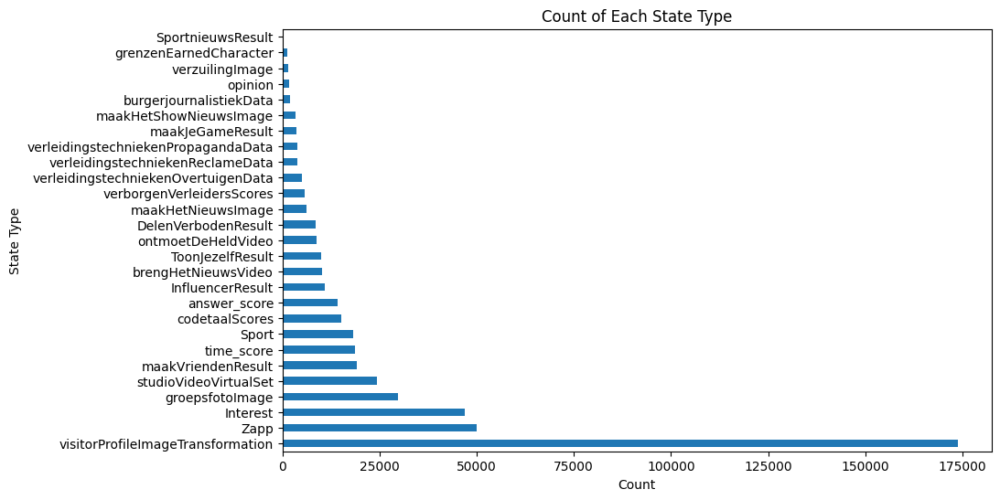

In [ ]:
#Count of Each State Type: distribution of ENGAGEMENT
import matplotlib.pyplot as plt
state_type_counts = df_state['state_type'].value_counts()

plt.figure(figsize=(10, 6))
state_type_counts.plot(kind='barh')
plt.xlabel('Count')
plt.ylabel('State Type')
plt.title('Count of Each State Type')
plt.show()


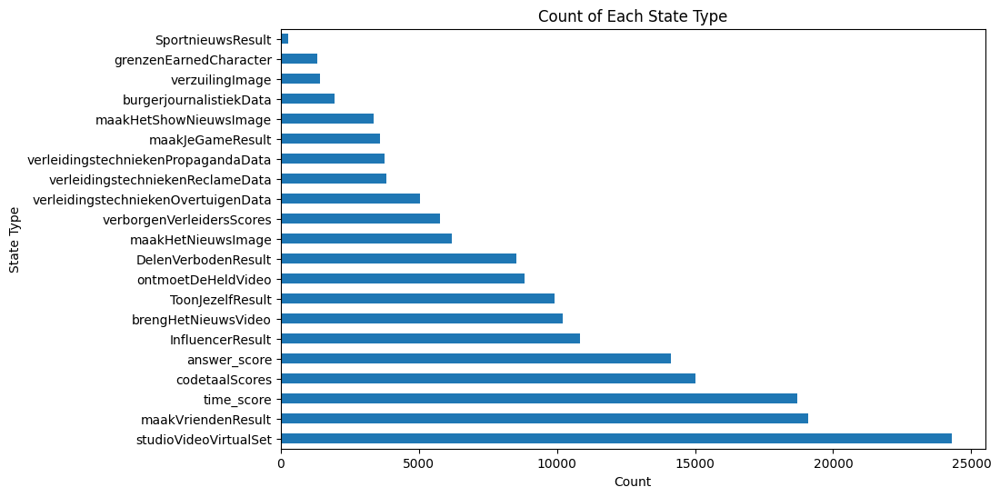

In [ ]:
#Count of Each State Type: distribution of INTERACTION
import matplotlib.pyplot as plt
excluded_state_type = ['Zapp', 'Interest', 'Sport', 'visitorProfileImageTransformation', 'groepsfotoImage', 'opinion']
filtered_state_type_counts = df_state['state_type'].value_counts().drop(excluded_state_type)

plt.figure(figsize=(10, 6))
filtered_state_type_counts.plot(kind='barh')
plt.xlabel('Count')
plt.ylabel('State Type')
plt.title('Count of Each State Type')
plt.show()


In [ ]:
#state values text - INTERACTION
filtered_state_type_counts = filtered_state_type_counts.reset_index()
state_value_lookup = {}

for state_type in filtered_state_type_counts['state_type']:
    matched_rows = df_state[df_state['state_type'] == state_type]

    all_values = matched_rows['state_value'].explode().unique()

    state_value_lookup[state_type] = set(all_values)

for state_type, fields in state_value_lookup.items():
    print(f"{state_type}: {fields}")


studioVideoVirtualSet: {'allowMediaReactor'}
maakVriendenResult: {'interest', 'score'}
time_score: {'correct', 'total', 'incorrect'}
codetaalScores: {'numPoints', 'numRounds', 'numOpponentPoints'}
answer_score: {'correct', 'total', 'incorrect'}
InfluencerResult: {nan}
brengHetNieuwsVideo: {'allowMediaReactor'}
ToonJezelfResult: {'correct', 'total', 'incorrect'}
ontmoetDeHeldVideo: {'archetype'}
DelenVerbodenResult: {'correct', 'total', 'incorrect'}
maakHetNieuwsImage: {'amount_stars', 'times_viewed'}
verborgenVerleidersScores: {'Total', 'Correct'}
verleidingstechniekenOvertuigenData: {'amount_bad', 'amount_good'}
verleidingstechniekenReclameData: {'amount_bad', 'amount_good'}
verleidingstechniekenPropagandaData: {'amount_bad', 'amount_good'}
maakJeGameResult: {'levelData'}
maakHetShowNieuwsImage: {'total_score', 'question_score', 'image_score', 'headline_score'}
burgerjournalistiekData: {'type'}
verzuilingImage: {nan}
grenzenEarnedCharacter: {'characterName'}
SportnieuwsResult: {nan}


In [ ]:
#INTERACTION Category Mapping

#Define dictionaries
category_mapping = {
    #Video Interaction
    'studioVideoVirtualSet': 'Video Interaction',
    'brengHetNieuwsVideo': 'Video Interaction',

    #Interest Selection
    'maakVriendenResult': 'Interest Selection',
    'burgerjournalistiekData': 'Interest Selection',
    'InfluencerResult': 'Interest Selection',
    'SportnieuwsResult': 'Interest Selection',

    #Role Construction
    'ontmoetDeHeldVideo': 'Role Construction',
    'grenzenEarnedCharacter': 'Role Construction',

    #Opinion Expression
    'verleidingstechniekenOvertuigenData': 'Opinion Expression',
    'verleidingstechniekenReclameData': 'Opinion Expression',
    'verleidingstechniekenPropagandaData': 'Opinion Expression',
    'verzuilingImage': 'Opinion Expression',

    #Quizzes interaction
    'DelenVerbodenResult': 'Quizzes Interaction',
    'answer_score': 'Quizzes Interaction',
    'verborgenVerleidersScores': 'Quizzes Interaction',
    'ToonJezelfResult': 'Quizzes Interaction',

    #Scoring Mechanism
    'codetaalScores': 'Scoring Interaction',
    'maakHetShowNieuwsImage': 'Scoring Interaction',
    'time_score': 'Scoring Interaction',
    'maakHetNieuwsImage': 'Scoring Interaction',

    #Game Design
    'maakJeGameResult': 'Game Design'}

#further investigation in the outcomes of OPINION EXPRESSION Session

#Analysis 1: Average number of interaction within a category

In [ ]:
#Analysis 1: Average number of interactions within a category

from collections import defaultdict

#Map the interaction category
df['interaction_category_custom'] = df_state['state_type'].map(category_mapping)

#Count frequencies of custom interaction categories
custom_category_counts = df['interaction_category_custom'].value_counts().reset_index()
custom_category_counts.columns = ['interaction_category_custom', 'count']

#construct list of category of state_type
category_to_types = defaultdict(list)
for k, v in category_mapping.items():
    category_to_types[v].append(k)

category_state_type_counts = pd.DataFrame([
    {"interaction_category_custom": cat, "num_state_types": len(state_types)}
    for cat, state_types in category_to_types.items()
])

custom_category_enriched = pd.merge(
    left=custom_category_counts,
    right=category_state_type_counts,
    on='interaction_category_custom',
    how='left'
)

custom_category_enriched['avg_behavior_per_type'] = (
    custom_category_enriched['count'] / custom_category_enriched['num_state_types']
).round(2)


custom_category_enriched

,interaction_category_custom,count,num_state_types,avg_behavior_per_type
0,Scoring Interaction,43283,4,10820.75
1,Quizzes Interaction,38339,4,9584.75
2,Video Interaction,34490,2,17245.00
3,Interest Selection,32147,4,8036.75
4,Opinion Expression,14073,4,3518.25
5,Role Construction,10133,2,5066.50
6,Game Design,3605,1,3605.00


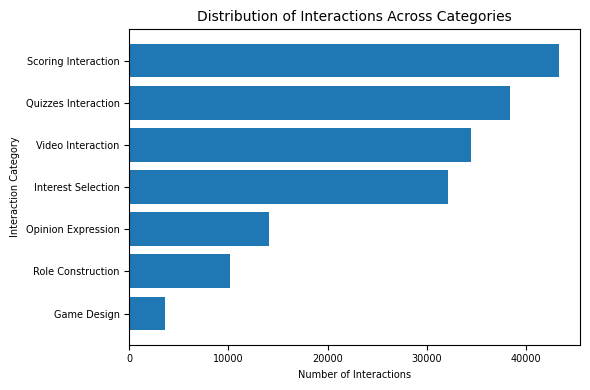

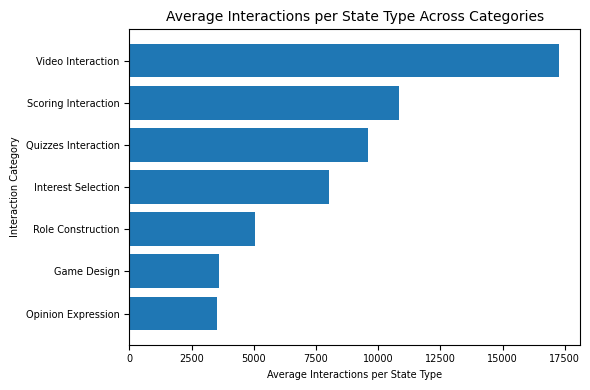

In [ ]:
import matplotlib.pyplot as plt
# Chart 1: Distribution of Interactions Across Categories
custom_category_enriched_sorted_count = custom_category_enriched.sort_values('count', ascending=True)
plt.figure(figsize=(6, 4))
plt.barh(custom_category_enriched_sorted_count['interaction_category_custom'], custom_category_enriched_sorted_count['count'])
plt.ylabel("Interaction Category", fontsize = 7)
plt.xlabel("Number of Interactions", fontsize = 7)
plt.title("Distribution of Interactions Across Categories", fontsize = 10)
plt.xticks(fontsize = 7)
plt.yticks(fontsize = 7)
plt.tight_layout()
plt.show()

# Chart 2: Average Interactions per State Type Across Categories
custom_category_enriched_sorted_avg = custom_category_enriched.sort_values('avg_behavior_per_type', ascending=True)
plt.figure(figsize=(6, 4))
plt.barh(custom_category_enriched_sorted_avg['interaction_category_custom'], custom_category_enriched_sorted_avg['avg_behavior_per_type'])
plt.ylabel("Interaction Category", fontsize = 7)
plt.xlabel("Average Interactions per State Type", fontsize = 7)
plt.title("Average Interactions per State Type Across Categories", fontsize = 10)
plt.xticks(fontsize = 7)
plt.yticks(fontsize = 7)
plt.tight_layout()
plt.show()


#Analysis 2: Average number of interactions per visitor in each category
For each interaction category, see how many unique visitors participated, and the total number of interactions, then calculate:
1. The average number of interactions per visitor in this category
2. The reach of this interaction categories: how many visitors engaged at least once

Reflection on:
1. which categories of interactions are more frequently explored;
2. which categories face broader audience




In [ ]:
#keep visitor_id & interaction_category
visitor_participation = df[['visitor_id', 'interaction_category_custom']].dropna()

#Calculate unique visitors in each category
unique_visitors_per_category = visitor_participation.groupby('interaction_category_custom')['visitor_id'].nunique().reset_index()
unique_visitors_per_category.columns = ['interaction_category_custom', 'unique_visitors']

#Calculate total number of interactions in each category
total_interaction_per_category = df['interaction_category_custom'].value_counts().reset_index()
total_interaction_per_category.columns = ['interaction_category_custom', 'total_interactions']

#Merge the two dataframe
visitor_participation_enriched = pd.merge(
    left=unique_visitors_per_category,
    right=total_interaction_per_category,
    on='interaction_category_custom',
    how='left'
)

#Calculate every visitors' average interaction times in each categories
visitor_participation_enriched['avg_interactions_per_visitor'] = (
    visitor_participation_enriched['total_interactions'] / visitor_participation_enriched['unique_visitors']
).round(2)

visitor_participation_enriched

,interaction_category_custom,unique_visitors,total_interactions,avg_interactions_per_visitor
0,Game Design,3036,3605,1.19
1,Interest Selection,17956,32147,1.79
2,Opinion Expression,9902,14073,1.42
3,Quizzes Interaction,17277,38339,2.22
4,Role Construction,8004,10133,1.27
5,Scoring Interaction,18953,43283,2.28
6,Video Interaction,18004,34490,1.92


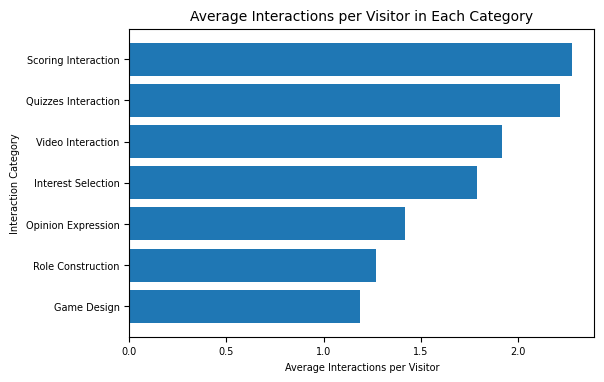

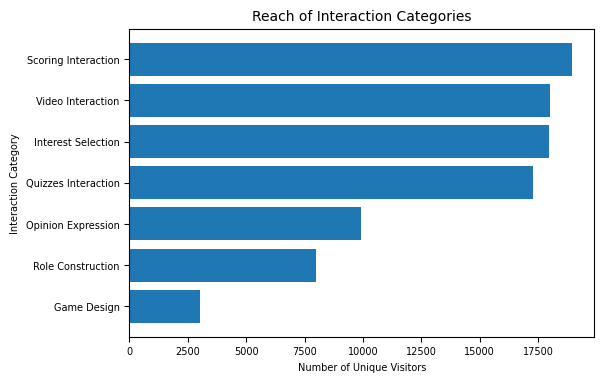

In [ ]:
import matplotlib.pyplot as plt
visitor_participation_enriched_sorted_avg = visitor_participation_enriched.sort_values('avg_interactions_per_visitor', ascending=True)
visitor_participation_enriched_sorted_reach = visitor_participation_enriched.sort_values('unique_visitors', ascending=True)
# Chart: Average Interactions per Visitor
plt.figure(figsize=(6, 4))
plt.barh(visitor_participation_enriched_sorted_avg['interaction_category_custom'], visitor_participation_enriched_sorted_avg['avg_interactions_per_visitor'])
plt.xlabel("Average Interactions per Visitor", fontsize = 7)
plt.ylabel("Interaction Category", fontsize = 7)
plt.title("Average Interactions per Visitor in Each Category", fontsize = 10)
plt.xticks(fontsize = 7)
plt.yticks(fontsize = 7)
plt.show()

# Chart: Reach of Interaction Categories (Unique Visitors)
plt.figure(figsize=(6, 4))
plt.barh(visitor_participation_enriched_sorted_reach['interaction_category_custom'], visitor_participation_enriched_sorted_reach['unique_visitors'])
plt.xlabel("Number of Unique Visitors", fontsize = 7)
plt.ylabel("Interaction Category", fontsize = 7)
plt.title("Reach of Interaction Categories", fontsize = 10)
plt.xticks(fontsize = 7)
plt.yticks(fontsize = 7)
plt.show()


#Analysis 3: Proportion of behavior types to toal behaviors

In [ ]:
total_interaction_all = custom_category_counts['count'].sum()
custom_category_counts['percentage'] = (custom_category_counts['count'] / total_interaction_all*100).round(2)
custom_category_counts

,interaction_category_custom,count,percentage
0,Scoring Interaction,43283,24.58
1,Quizzes Interaction,38339,21.77
2,Video Interaction,34490,19.59
3,Interest Selection,32147,18.26
4,Opinion Expression,14073,7.99
5,Role Construction,10133,5.76
6,Game Design,3605,2.05


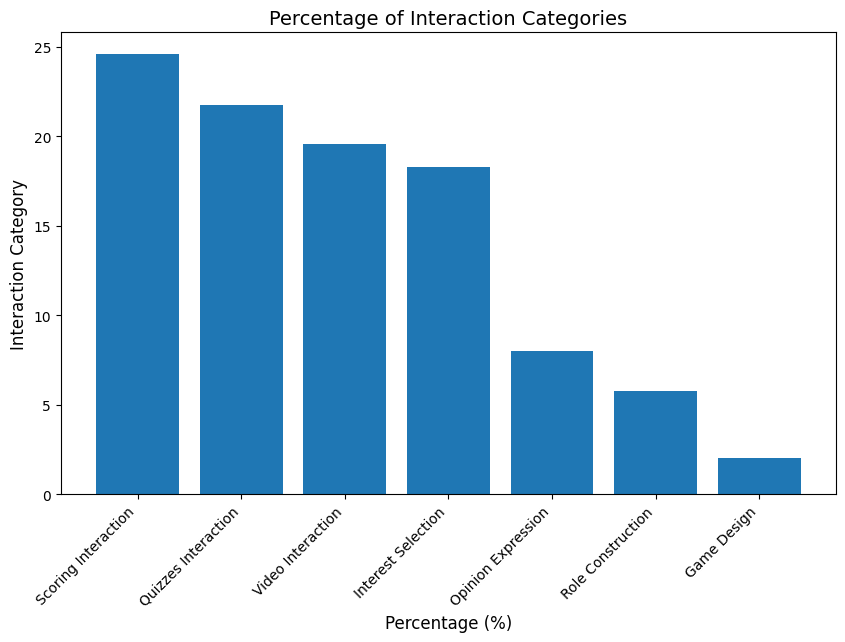

In [ ]:
labels = custom_category_counts['interaction_category_custom']
sizes = custom_category_counts['percentage']

# Sort categories by percentage for better visualization
custom_category_counts_sorted = custom_category_counts.sort_values('percentage', ascending=False)


plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.bar(custom_category_counts_sorted['interaction_category_custom'], custom_category_counts_sorted['percentage'])

plt.xlabel("Percentage (%)", fontsize=12)
plt.ylabel("Interaction Category", fontsize=12)
plt.title("Percentage of Interaction Categories", fontsize=14)
plt.xticks(fontsize=10, rotation = 45, ha = 'right')
plt.yticks(fontsize=10)

plt.show()

# Visitor-Level Engagement Analysis
What are visitors like based on the data they have provided?
1. How many visitors are highly engaged and how many are just passing by?
2. What does these high/low-engaged user profile look like?
3. Are particular visitors "light browsers" or "immersive users"? How much percentage do they take?

To help the public see how their behaviour are quantified and counted.

(Focusing on columns visitor_id & state_type)

By analysing visitor_id & installation data, followings information can be analyzed on individual visitor level:
1. total engagement times
2. number of engagement categories involved
3. number of installations having engaged

In [ ]:
df_state

,visitor_id,datetime,installation,state,parsed_state,state_type,state_value
0,6593cfd44cc1c34edc012514,2024/1/2 8:58,mobile-app-api,"('Zapp', ['Drama', 'Komedie', 'Oorlog'])","(Zapp, [Drama, Komedie, Oorlog])",Zapp,"[Drama, Komedie, Oorlog]"
1,6593cfd44cc1c34edc012514,2024/1/2 8:59,mobile-app-api,"('Interest', ['Muziek', 'Thuis en familie', 'M...","(Interest, [Muziek, Thuis en familie, Mediageb...",Interest,"[Muziek, Thuis en familie, Mediagebruik]"
4,6593cfd44cc1c34edc012514,2024/1/2 9:10,Delen verboden,"('DelenVerbodenResult', {'correct': 0, 'incorr...","(DelenVerbodenResult, {'correct': 0, 'incorrec...",DelenVerbodenResult,"{'correct': 0, 'incorrect': 3, 'total': 3}"
5,6593cfd44cc1c34edc012514,2024/1/2 9:11,De wereld binnen handbereik,"('Sport', ['Voetbal'])","(Sport, [Voetbal])",Sport,[Voetbal]
6,6593cfd44cc1c34edc012514,2024/1/2 9:11,De wereld binnen handbereik,"('visitorProfileImageTransformation', [])","(visitorProfileImageTransformation, [])",visitorProfileImageTransformation,[]
...,...,...,...,...,...,...,...
709690,6630f4195d21726d240e2a8d,2024/4/30 13:40,mobile-app-api,"('Zapp', ['Jeugdfilm', 'Drama', 'Komedie'])","(Zapp, [Jeugdfilm, Drama, Komedie])",Zapp,"[Jeugdfilm, Drama, Komedie]"
709691,6630f4195d21726d240e2a8d,2024/4/30 13:41,mobile-app-api,"('Sport', [])","(Sport, [])",Sport,[]
709692,6630f4195d21726d240e2a8d,2024/4/30 13:41,mobile-app-api,"('Interest', ['Lifestyle', 'Thuis en familie',...","(Interest, [Lifestyle, Thuis en familie, Sport])",Interest,"[Lifestyle, Thuis en familie, Sport]"
709693,6630f4195d21726d240e2a8d,2024/4/30 13:41,mobile-app-api,"('Sport', ['Watersport'])","(Sport, [Watersport])",Sport,[Watersport]


In [ ]:
#ENGAGEMENT Category Mapping

#Define dictionaries
category_mapping_engagement = {
    #Video Interaction
    'studioVideoVirtualSet': 'Video Interaction',
    'brengHetNieuwsVideo': 'Video Interaction',

    #Interest Selection
    'maakVriendenResult': 'Interest Selection',
    'burgerjournalistiekData': 'Interest Selection',
    'InfluencerResult': 'Interest Selection',
    'SportnieuwsResult': 'Interest Selection',

    #Role Construction
    'ontmoetDeHeldVideo': 'Role Construction',
    'grenzenEarnedCharacter': 'Role Construction',

    #Opinion Expression
    'verleidingstechniekenOvertuigenData': 'Opinion Expression',
    'verleidingstechniekenReclameData': 'Opinion Expression',
    'verleidingstechniekenPropagandaData': 'Opinion Expression',
    'verzuilingImage': 'Opinion Expression',

    #Quizzes interaction
    'DelenVerbodenResult': 'Quizzes Interaction',
    'answer_score': 'Quizzes Interaction',
    'verborgenVerleidersScores': 'Quizzes Interaction',
    'ToonJezelfResult': 'Quizzes Interaction',

    #Scoring Mechanism
    'codetaalScores': 'Scoring Interaction',
    'maakHetShowNieuwsImage': 'Scoring Interaction',
    'time_score': 'Scoring Interaction',
    'maakHetNieuwsImage': 'Scoring Interaction',

    #Game Design
    'maakJeGameResult': 'Game Design',

    #Basic Information Setup
    'Zapp': 'Basic Information Setup',
    'Interest': 'Basic Information Setup',
    'Sport': 'Basic Information Setup',
    'groepsfotoImage': 'Basic Information Setup',

    #Knowledge Acquiring
    'opinion': 'Knowledge Acquiring',
    'visitorProfileImageTransformation': 'Knowledge Acquiring'
    }

In [ ]:
df_state['engagement_category_custom'] = df_state['state_type'].map(category_mapping_engagement)
df_state

,visitor_id,datetime,installation,state,parsed_state,state_type,state_value,engagement_category_custom
0,6593cfd44cc1c34edc012514,2024/1/2 8:58,mobile-app-api,"('Zapp', ['Drama', 'Komedie', 'Oorlog'])","(Zapp, [Drama, Komedie, Oorlog])",Zapp,"[Drama, Komedie, Oorlog]",Basic Information Setup
1,6593cfd44cc1c34edc012514,2024/1/2 8:59,mobile-app-api,"('Interest', ['Muziek', 'Thuis en familie', 'M...","(Interest, [Muziek, Thuis en familie, Mediageb...",Interest,"[Muziek, Thuis en familie, Mediagebruik]",Basic Information Setup
4,6593cfd44cc1c34edc012514,2024/1/2 9:10,Delen verboden,"('DelenVerbodenResult', {'correct': 0, 'incorr...","(DelenVerbodenResult, {'correct': 0, 'incorrec...",DelenVerbodenResult,"{'correct': 0, 'incorrect': 3, 'total': 3}",Quizzes Interaction
5,6593cfd44cc1c34edc012514,2024/1/2 9:11,De wereld binnen handbereik,"('Sport', ['Voetbal'])","(Sport, [Voetbal])",Sport,[Voetbal],Basic Information Setup
6,6593cfd44cc1c34edc012514,2024/1/2 9:11,De wereld binnen handbereik,"('visitorProfileImageTransformation', [])","(visitorProfileImageTransformation, [])",visitorProfileImageTransformation,[],Knowledge Acquiring
...,...,...,...,...,...,...,...,...
709690,6630f4195d21726d240e2a8d,2024/4/30 13:40,mobile-app-api,"('Zapp', ['Jeugdfilm', 'Drama', 'Komedie'])","(Zapp, [Jeugdfilm, Drama, Komedie])",Zapp,"[Jeugdfilm, Drama, Komedie]",Basic Information Setup
709691,6630f4195d21726d240e2a8d,2024/4/30 13:41,mobile-app-api,"('Sport', [])","(Sport, [])",Sport,[],Basic Information Setup
709692,6630f4195d21726d240e2a8d,2024/4/30 13:41,mobile-app-api,"('Interest', ['Lifestyle', 'Thuis en familie',...","(Interest, [Lifestyle, Thuis en familie, Sport])",Interest,"[Lifestyle, Thuis en familie, Sport]",Basic Information Setup
709693,6630f4195d21726d240e2a8d,2024/4/30 13:41,mobile-app-api,"('Sport', ['Watersport'])","(Sport, [Watersport])",Sport,[Watersport],Basic Information Setup


In [ ]:
def compute_engagement(group):
    visitor_id = group.name
    total_engagement_times = len(group) #sum of visitor engagement records
    total_categories_number = group['engagement_category_custom'].nunique() #unique number of engagement categories

    non_special = group[~group['state_type'].isin(['opinion', 'visitorProfileImageTransformation'])]  #valid interaction results
    n_unique_states = non_special['state_type'].nunique() #unique installation of interactions

    special = group[group['state_type'].isin(['opinion', 'visitorProfileImageTransformation'])]  #valid knowledge acquiring results
    n_unique_special_installations = special['installation'].nunique() #unique installation of knowledge acquiring engagement

    return pd.Series({
        'total engagement times': total_engagement_times,
        'total categories engaged': total_categories_number,
        'total installations engaged': n_unique_states + n_unique_special_installations #unique installation of interactions + knowledge acquiring
    })


visitor_profiles = df_state.groupby('visitor_id').apply(compute_engagement).reset_index()
visitor_profiles

<ipython-input-36-92111a052473>:19: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  visitor_profiles = df_state.groupby('visitor_id').apply(compute_engagement).reset_index()


,visitor_id,total engagement times,total categories engaged,total installations engaged
0,6593cfd44cc1c34edc012514,40,8,25
1,6593cfda5192fed6d00da8ff,36,7,21
2,6593d04f4cc1c34edc012515,15,5,10
3,6593d0bbcce07e73d5093346,15,4,11
4,6593d19f3e574aa5f608f37d,36,7,19
...,...,...,...,...
32285,6630ecb77425d67b4b073010,6,3,6
32286,6630ecebbf1577394d0bf8dd,8,3,8
32287,6630edb0bf1577394d0bf901,4,2,4
32288,6630efb59ac7c0c26e03435c,19,7,13


In [ ]:
total_engagement = visitor_profiles['total engagement times'].max()
total_categories_engaged = visitor_profiles['total categories engaged'].max()
total_installations_engaged = visitor_profiles['total installations engaged'].max()
print(f"total engagement max: {total_engagement}\n",
  f"total categories engaged max: {total_categories_engaged}\n",
  f"total installations engaged min: {total_installations_engaged}"
      )

total engagement max: 334
 total categories engaged max: 9
 total installations engaged min: 40


In [ ]:
total_engagement = visitor_profiles['total engagement times'].min()
total_categories_engaged = visitor_profiles['total categories engaged'].min()
total_installations_engaged = visitor_profiles['total installations engaged'].min()
print(f"total engagement min: {total_engagement}\n",
  f"total categories engaged min: {total_categories_engaged}\n",
  f"total installations engaged min: {total_installations_engaged}"
      )

total engagement min: 1
 total categories engaged min: 1
 total installations engaged min: 1


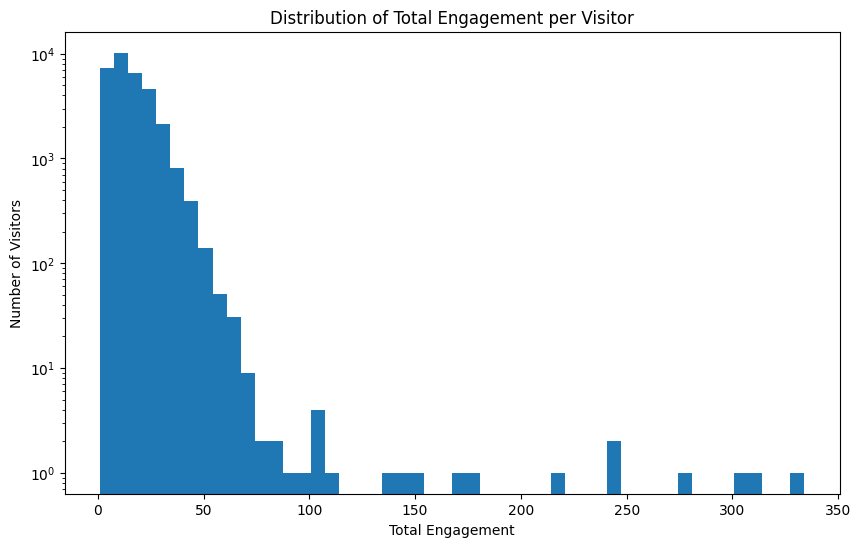

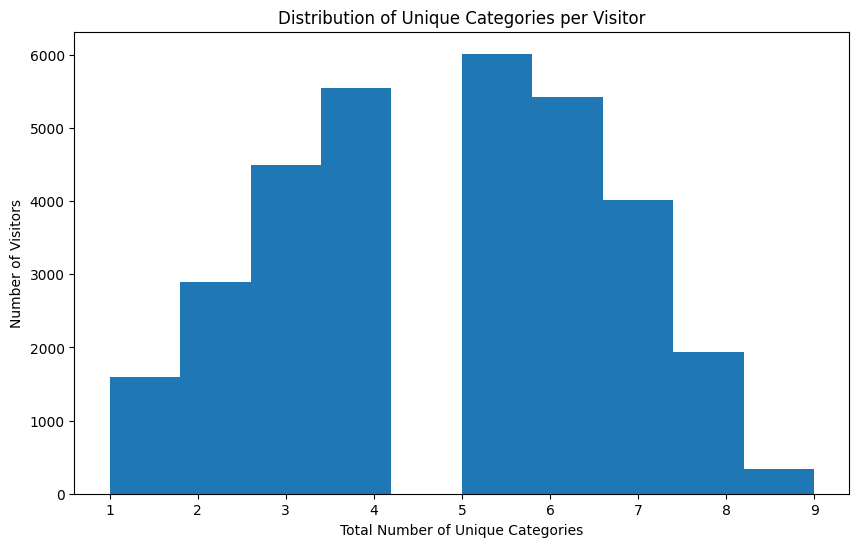

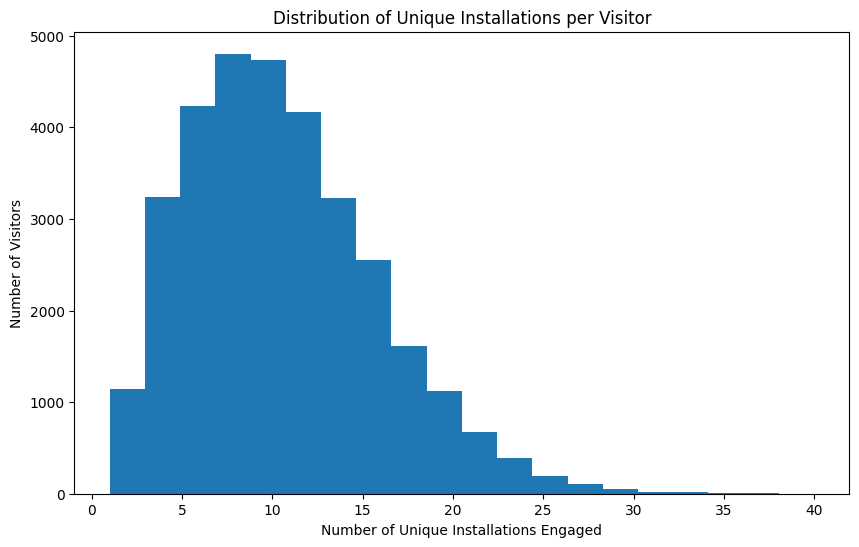

In [ ]:
import matplotlib.pyplot as plt

# Visualize total interactions per visitor
plt.figure(figsize=(10, 6))
plt.hist(visitor_profiles['total engagement times'], bins=50, log=True)
plt.xlabel('Total Engagement')
plt.ylabel('Number of Visitors')
plt.title('Distribution of Total Engagement per Visitor')
plt.show()


# Visualize unique categories per visitor
plt.figure(figsize=(10, 6))
plt.hist(visitor_profiles['total categories engaged'], bins=10)
plt.xlabel('Total Number of Unique Categories')
plt.ylabel('Number of Visitors')
plt.title('Distribution of Unique Categories per Visitor')
plt.show()


# Visualize unique installations per visitor
plt.figure(figsize=(10, 6))
plt.hist(visitor_profiles['total installations engaged'], bins=20)
plt.xlabel('Number of Unique Installations Engaged')
plt.ylabel('Number of Visitors')
plt.title('Distribution of Unique Installations per Visitor')
plt.show()

#3D Behavior Portraits Model (KMEANS)

In [ ]:
from sklearn.ensemble import IsolationForest

features = ['total engagement times', 'total categories engaged', 'total installations engaged']

clf = IsolationForest(max_samples=14000, random_state=42)
outlier_predictions = clf.fit_predict(visitor_profiles[features])
visitor_profiles_filtered = visitor_profiles[outlier_predictions == 1]
visitor_profiles_filtered

,visitor_id,total engagement times,total categories engaged,total installations engaged
0,6593cfd44cc1c34edc012514,40,8,25
1,6593cfda5192fed6d00da8ff,36,7,21
2,6593d04f4cc1c34edc012515,15,5,10
3,6593d0bbcce07e73d5093346,15,4,11
4,6593d19f3e574aa5f608f37d,36,7,19
...,...,...,...,...
32284,6630ecb4bf1577394d0bf8d9,16,4,9
32285,6630ecb77425d67b4b073010,6,3,6
32286,6630ecebbf1577394d0bf8dd,8,3,8
32287,6630edb0bf1577394d0bf901,4,2,4


In [ ]:
from sklearn.preprocessing import StandardScaler

features = ['total engagement times', 'total categories engaged', 'total installations engaged']
scaler = StandardScaler()
scaled_data = scaler.fit_transform(visitor_profiles_filtered[features])
scaled_data

array([[ 3.05365327,  1.85741549,  3.13815667],
       [ 2.57355438,  1.29624304,  2.29956628],
       [ 0.05303522,  0.17389814, -0.00655728],
       ...,
       [-0.78713783, -0.94844676, -0.42585248],
       [-1.26723672, -1.50961921, -1.26444287],
       [ 0.53313411,  1.29624304,  0.62238551]])

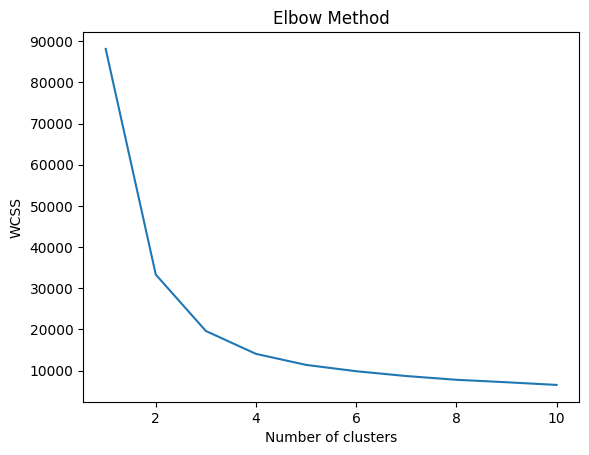

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(scaled_data)
    wcss.append(kmeans.inertia_)

plt.plot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

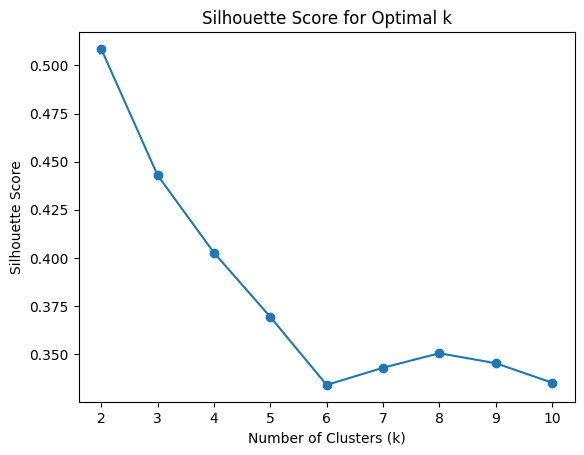

In [ ]:
from sklearn.metrics import silhouette_score

silhouette_scores = []
for i in range(2, 11):  # 尝试 k 值从 2 到 10 (轮廓系数需要至少两个聚类)
    kmeans = KMeans(n_clusters=i, random_state=42)
    labels = kmeans.fit_predict(scaled_data)
    silhouette_scores.append(silhouette_score(scaled_data, labels))

plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.title('Silhouette Score for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.show()

In [ ]:
kmeans = KMeans(n_clusters=4, random_state=42)
visitor_profiles_filtered['cluster'] = kmeans.fit_predict(scaled_data)

<ipython-input-44-4d81ee4ee589>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  visitor_profiles_filtered['cluster'] = kmeans.fit_predict(scaled_data)


In [ ]:
cluster_centers = kmeans.cluster_centers_
cluster_features_df = pd.DataFrame(cluster_centers, columns=['total engagement times', 'total categories engaged', 'total installations engaged'])
cluster_features_df['cluster'] = cluster_features_df.index
cluster_features_df

,total engagement times,total categories engaged,total installations engaged,cluster
0,-1.106796,-1.306633,-1.191259,0
1,0.475691,0.654195,0.540537,1
2,-0.385487,-0.204682,-0.353294,2
3,1.724531,1.307540,1.666308,3


In [ ]:
original_cluster_centers = scaler.inverse_transform(cluster_centers)
original_cluster_features_df = pd.DataFrame(original_cluster_centers, columns=['total engagement times', 'total categories engaged', 'total installations engaged'])
original_cluster_features_df['cluster'] = original_cluster_features_df.index
original_cluster_features_df

,total engagement times,total categories engaged,total installations engaged,cluster
0,5.336732,2.361717,4.349081,0
1,18.521403,5.855881,12.609592,1
2,11.346404,4.325376,8.346099,2
3,28.926261,7.020131,17.979416,3


In [ ]:
persona_mapping = {
    0: ("Casual Glancer", "You came, you peeked, and you left. You may have looked around, but stayed mostly light touched."), #low-low-low
    1: ("Driven Explorer", "You moved fast and interacted quite often, but largely driven by particular interaction forms."), #high-medium-high
    2: ("Balanced Explorer", "You dipped your toes in different places, tried things here and there. Not too little, not too much, you steadily explored with great balance."), #medium-medium-medium
    3: ("Immersive Completist", "Fully immersed in the experience, you're the kind of visitor who wants to try everything. No interactions and displays escapes you."), #high-high-high
}

visitor_profiles_filtered['persona_name'] = visitor_profiles_filtered['cluster'].map(lambda x: persona_mapping.get(x, (None, None))[0])
visitor_profiles_filtered['persona_description'] = visitor_profiles_filtered['cluster'].map(lambda x: persona_mapping.get(x, (None, None))[1])
visitor_profiles_filtered

<ipython-input-47-60f9d5f521aa>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  visitor_profiles_filtered['persona_name'] = visitor_profiles_filtered['cluster'].map(lambda x: persona_mapping.get(x, (None, None))[0])
<ipython-input-47-60f9d5f521aa>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  visitor_profiles_filtered['persona_description'] = visitor_profiles_filtered['cluster'].map(lambda x: persona_mapping.get(x, (None, None))[1])


,visitor_id,total engagement times,total categories engaged,total installations engaged,cluster,persona_name,persona_description
0,6593cfd44cc1c34edc012514,40,8,25,3,Immersive Completist,"Fully immersed in the experience, you're the k..."
1,6593cfda5192fed6d00da8ff,36,7,21,3,Immersive Completist,"Fully immersed in the experience, you're the k..."
2,6593d04f4cc1c34edc012515,15,5,10,2,Balanced Explorer,"You dipped your toes in different places, trie..."
3,6593d0bbcce07e73d5093346,15,4,11,2,Balanced Explorer,"You dipped your toes in different places, trie..."
4,6593d19f3e574aa5f608f37d,36,7,19,3,Immersive Completist,"Fully immersed in the experience, you're the k..."
...,...,...,...,...,...,...,...
32284,6630ecb4bf1577394d0bf8d9,16,4,9,2,Balanced Explorer,"You dipped your toes in different places, trie..."
32285,6630ecb77425d67b4b073010,6,3,6,0,Casual Glancer,"You came, you peeked, and you left. You may ha..."
32286,6630ecebbf1577394d0bf8dd,8,3,8,2,Balanced Explorer,"You dipped your toes in different places, trie..."
32287,6630edb0bf1577394d0bf901,4,2,4,0,Casual Glancer,"You came, you peeked, and you left. You may ha..."


In [ ]:
# Export the DataFrame to a CSV file
visitor_profiles_filtered.to_csv('/content/drive/MyDrive/visitor_profiles_filtered_kmeasn.csv', index=False)

In [ ]:
persona_summary = visitor_profiles_filtered.groupby('persona_name').agg(
    visitor_count=('visitor_id', 'count')).reset_index()
persona_summary['percentage'] = (persona_summary['visitor_count'] / persona_summary['visitor_count'].sum() * 100).round(2)
persona_summary

,persona_name,visitor_count,percentage
0,Balanced Explorer,9844,33.50
1,Casual Glancer,6964,23.70
2,Driven Explorer,8153,27.75
3,Immersive Completist,4421,15.05


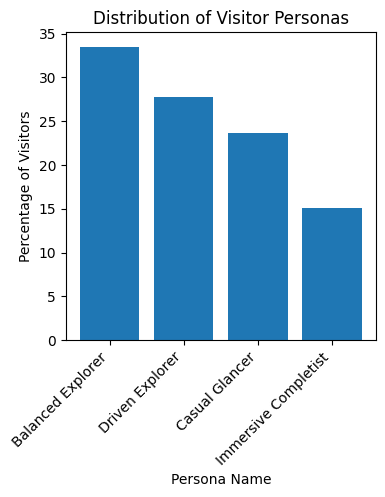

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(4, 4))
persona_summary_sorted = persona_summary.sort_values('percentage', ascending=False)
plt.bar(persona_summary_sorted['persona_name'], persona_summary_sorted['percentage'])
plt.xlabel("Persona Name")
plt.ylabel("Percentage of Visitors")
plt.xticks(rotation = 45, ha = 'right')
plt.title("Distribution of Visitor Personas")
plt.show()


In [ ]:
# Get the cluster centers from original_cluster_features_df
radar_data = original_cluster_features_df[['total engagement times', 'total categories engaged', 'total installations engaged', 'cluster']]

# Rename the 'cluster' column to match the 'groupby' column in the original code
radar_data = radar_data.rename(columns={'cluster': 'persona name'})

# Set 'behavior_profile' as the index
radar_data = radar_data.set_index('persona name')

radar_data

,total engagement times,total categories engaged,total installations engaged
persona name,,,
0,5.336732,2.361717,4.349081
1,18.521403,5.855881,12.609592
2,11.346404,4.325376,8.346099
3,28.926261,7.020131,17.979416


In [ ]:
#create radar plots
import pandas as pd
import ast
import numpy as np
import matplotlib.pyplot as plt

#add persona name
radar_data_plots = radar_data.reset_index()
radar_data_plots['persona name'] = radar_data_plots['persona name'].map(lambda x: persona_mapping.get(x, (None,))[0])
radar_data_plots = radar_data_plots[radar_data_plots['persona name'].notna()] #filter the undefined personas

#standardize values
columns_to_scale = ['total engagement times' , 'total categories engaged', 'total installations engaged']
radar_data_scaled = radar_data_plots.copy()
for col in columns_to_scale:
    radar_data_scaled[col] = radar_data_scaled[col] / radar_data_scaled[col].max()

#radar plots structures
labels = ['Total\nEngagement', 'Engaged\nCategories', 'Engaged\nInstallations']
angles = np.linspace(0, 2 * np.pi, len(labels), endpoint=False).tolist()
angles += angles[:1]
radar_data_scaled

,persona name,total engagement times,total categories engaged,total installations engaged
0,Casual Glancer,0.184494,0.336421,0.241892
1,Driven Explorer,0.640297,0.834156,0.701335
2,Balanced Explorer,0.392253,0.616139,0.464203
3,Immersive Completist,1.000000,1.000000,1.000000


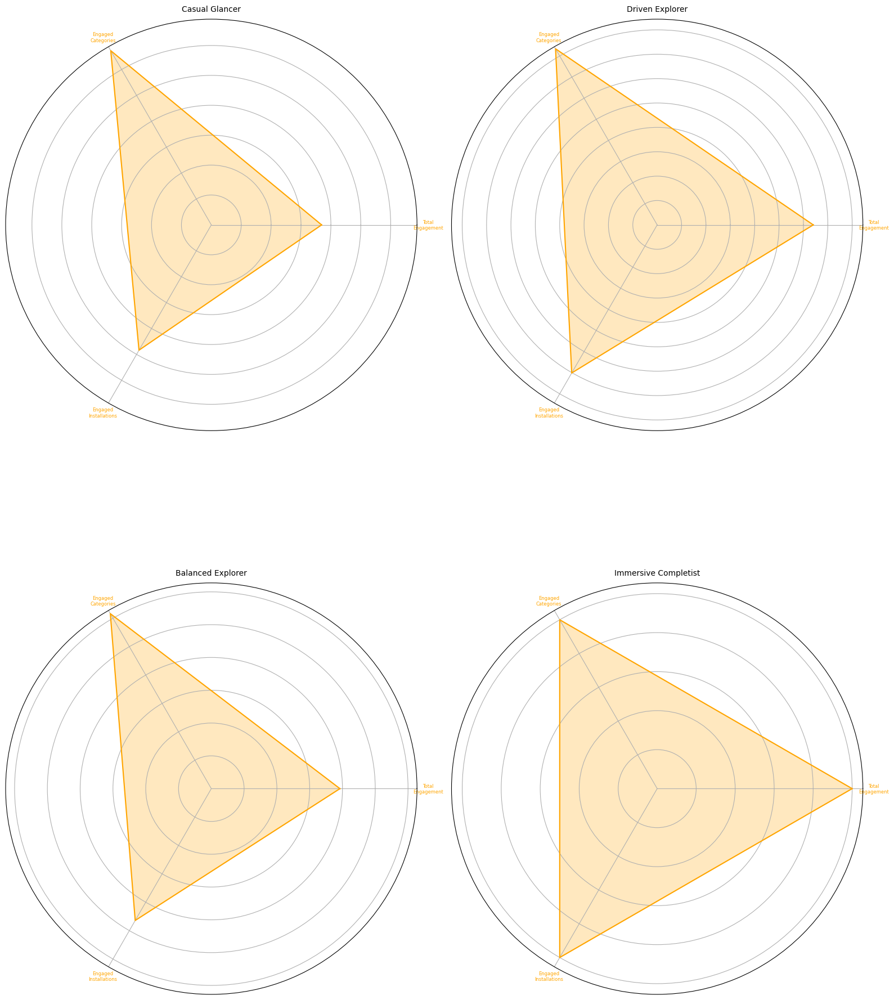

In [ ]:
values_list = []
names_list = []
for _, row in radar_data_scaled.iterrows():
    values = [
        row['total engagement times'],
        row['total categories engaged'],
        row['total installations engaged'],
    ]
    values += values[:1]
    values_list.append(values)
    names_list.append(row['persona name'])

#create grid of radar charts (2*2)
fig, axes = plt.subplots(2, 2, figsize=(16, 22), subplot_kw=dict(polar=True))
axes = axes.flatten()
for i in range(len(axes)):
  ax = axes[i]
  if i < len(values_list):
    values = values_list[i]
    name = names_list[i]

    ax.plot(angles, values, label=name,color='orange')
    ax.fill(angles, values, alpha=0.25, color='orange')
    ax.set_title(name, fontsize=10, pad=10)
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(labels, fontsize=6, color='orange')
    ax.set_yticklabels([])
    ax.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import plotly.express as px


labels = kmeans.labels_


fig = px.scatter_3d(
    visitor_profiles_filtered,
    x='total engagement times',
    y='total categories engaged',
    z='total installations engaged',
    hover_data=['visitor_id'],
    color='persona_name',
    title='Visitor Behavior Profile Cluster (KMeans)',
    labels={
        'total engagement times': 'total engagement times',
        'total categories engaged': 'total categories engaged',
        'total installations engaged': 'total installations engaged'
    }
)

fig.show()

#3D Behavior Portraits Model (FREQUENCY x BREADTH x DEPTH)

FREQUENCY: "total_interactions" (How many times have the visitor interacted in total?)

BREADTH: "unique_categories" (How many different types of interactions have the visitor touched on?)

DEPTH: "unique_installations" (How many different installations/exhibits are involved?)

Each dimension is divided into 3 layers:

**Low**: bottom 33% (low frequency, focused-category, centralized installation)

**Medium**: 33%-66% (medium participants)

**High**: top 33% (high frequency, multi-category, wide exploration)

In [ ]:
# Compute 33% and 66% quantiles for each dimension
quantiles = {
    'total engagement times': visitor_profiles['total engagement times'].quantile([0.33, 0.66]),
    'total categories engaged': visitor_profiles['total categories engaged'].quantile([0.33, 0.66]),
    'total installations engaged': visitor_profiles['total installations engaged'].quantile([0.33, 0.66]),
}

In [ ]:
# Define function
def label_quantile(value, q33, q66):
    if value <= q33:
        return 'Low'
    elif value <= q66:
        return 'Medium'
    else:
        return 'High'

In [ ]:
# Apply labeling
visitor_profiles['interaction_level'] = visitor_profiles['total engagement times'].apply(
    lambda x: label_quantile(x, quantiles['total engagement times'].loc[0.33], quantiles['total engagement times'].loc[0.66])
)
visitor_profiles['category_diversity'] = visitor_profiles['total categories engaged'].apply(
    lambda x: label_quantile(x, quantiles['total categories engaged'].loc[0.33], quantiles['total categories engaged'].loc[0.66])
)
visitor_profiles['installation_range'] = visitor_profiles['total installations engaged'].apply(
    lambda x: label_quantile(x, quantiles['total installations engaged'].loc[0.33], quantiles['total installations engaged'].loc[0.66])
)

In [ ]:
# Combine three labels
visitor_profiles['behavior_profile'] = (
    visitor_profiles['interaction_level'] + '-' +
    visitor_profiles['category_diversity'] + '-' +
    visitor_profiles['installation_range']
)

In [ ]:
visitor_profiles

,visitor_id,total engagement times,total categories engaged,total installations engaged,interaction_level,category_diversity,installation_range,behavior_profile
0,6593cfd44cc1c34edc012514,41,8,26,High,High,High,High-High-High
1,6593cfda5192fed6d00da8ff,37,7,22,High,High,High,High-High-High
2,6593d04f4cc1c34edc012515,16,5,11,Medium,Medium,Medium,Medium-Medium-Medium
3,6593d0bbcce07e73d5093346,16,4,12,Medium,Low,Medium,Medium-Low-Medium
4,6593d19f3e574aa5f608f37d,37,7,20,High,High,High,High-High-High
...,...,...,...,...,...,...,...,...
32288,6630ecb77425d67b4b073010,7,4,7,Low,Low,Low,Low-Low-Low
32289,6630ecebbf1577394d0bf8dd,9,3,9,Low,Low,Medium,Low-Low-Medium
32290,6630edb0bf1577394d0bf901,5,2,5,Low,Low,Low,Low-Low-Low
32291,6630efb59ac7c0c26e03435c,20,7,14,High,High,High,High-High-High


In [ ]:
# Count profile distribution
profile_distribution = visitor_profiles['behavior_profile'].value_counts().reset_index()
profile_distribution.columns = ['behavior_profile', 'visitor_count']
profile_distribution

,behavior_profile,visitor_count
0,Low-Low-Low,9451
1,High-High-High,5079
2,Medium-Medium-Medium,4658
3,High-Medium-High,3469
4,Medium-Low-Medium,2974
5,Low-Medium-Low,1070
6,High-Medium-Medium,825
7,Low-Medium-Medium,760
8,Medium-Medium-High,702
9,Low-Low-Medium,689


Visitor persona & description naming

In [ ]:
# Persona mapping dictionry
persona_mapping = {
    "High-High-High": ("Immersive Completist", "Fully immersed in the experience, you're the kind of visitor who wants to try everything. No interactions and displays escapes you."),
    "Low-Low-Low": ("Casual Glancer", "You came, you peeked, and you left. You may have looked around, but stayed mostly light touched."),
    "High-Low-Low": ("Deep Diver", "You found your thing, and you stuck with it. Whether by interest or instinct, you went deep instead of wide."),
    "Medium-Medium-Medium": ("Balanced Explorer", "You dipped your toes in different places, tried things here and there. Not too little, not too much, you steadily explored with great balance."),
    "High-Medium-High": ("Driven Explorer", "You moved fast and interacted quite often, but largely driven by particular interaction forms."),
    "Medium-High-High": ("Curiosity Mapper", "You're the kind of visitor who wants a bite of everything. You may not linger, but you see it all."),
    "Medium-Low-High": ("Pattern Seeker", "You moved widely, sought out a specific way to interact with exhibits and stayed true to it."),
    "High-High-Low": ("Intensive Explorer", "While others wandered, you stayed. A few installations were all it took to keep you busy, buttons, scores, stories and all."),
    "Medium-High-Low": ("Interaction-Driven Seeker", "You explored many types of interaction forms, but within just a few spaces. You stayed put, but never repeated yourself."),
    "Low-High-Low": ("Mini Explorer", "You didn't engaged much or visit wide, but you sampled a surprising variety of interaction forms in your short time."),
    "High-Low-High": ("High-Energy Explorer", "You engaged a lot and moved across the space, but always show special preference to the same interaction forms."),
    "High-Medium-Low": ("Concentrated Enthusiast", "You found your favourite corner and made it your kingdom. Not everything, not everywhere, but intensely and with purpose."),
    "Medium-Medium-High": ("Wandreing Engager", "You wandered, you tried, but you seldom repeat. You're the kind of visitors who explore with broad steps and light touches."),
    "Medium-High-Medium": ("Content Collector", "You didn't run through the whole space, but are willing to try new ways of interaction at every stop."),
    "Low-High-Medium": ("Selective Wanderer", "You touched on many ways of interaction, but lightly and rarely. You left a soft but thoughtful trace."),
    "Medium-Low-Medium": ("Patterned Participant", "You knew your preferred interaction patterns. You engaged again and again. That's not repetition. That's loyalty."),
    "High-Medium-Medium": ("Interaction Strategist", "You played like a pro, enough clicks to matter, enough variety to impress and no wasted moves."),
    "Low-Medium-Medium": ("Cautious Clicker", "You explored a bit, tried a few things, and moved through a number of displays. You did just enough to leave a quiet footprint."),
    "Medium-Medium-Low": ("Corner Explorer", "You explored actively, but may mostly in one space. You didn't need the whole map, you may just need one good spot."),
    "Low-Low-Medium": ("Quick Sampler", "You slipped in, glanced around, tried one or two things, and then moved on, without making much footprint."),
    "High-Low-Medium": ("Obsessed Clicker", "You had a clear mission and you executed it. Few interaction patterns, many active clicks, and across just the right number of places."),
    "Low-Medium-Low": ("Brief Explorer", "You didn't engaged much or visit wide, but you sampled just the right variety of interaction forms in your short time."),
    "Medium-Low-Low": ("Routine Visitor", "You stayed close to your familiarity, repeated a narrow set of actions within a small area, and didn’t ask for more."),
    "High-High-Medium": ("Immersive Explorer", "While you didn't visit everything, you still explore with great depth and breadth.")
}
visitor_profiles['persona_name'] = visitor_profiles['behavior_profile'].map(lambda x: persona_mapping.get(x, (None, None))[0])
visitor_profiles['persona_description'] = visitor_profiles['behavior_profile'].map(lambda x: persona_mapping.get(x, (None, None))[1])
visitor_profiles

,visitor_id,total engagement times,total categories engaged,total installations engaged,interaction_level,category_diversity,installation_range,behavior_profile,persona_name,persona_description
0,6593cfd44cc1c34edc012514,41,8,26,High,High,High,High-High-High,Immersive Completist,"Fully immersed in the experience, you're the k..."
1,6593cfda5192fed6d00da8ff,37,7,22,High,High,High,High-High-High,Immersive Completist,"Fully immersed in the experience, you're the k..."
2,6593d04f4cc1c34edc012515,16,5,11,Medium,Medium,Medium,Medium-Medium-Medium,Balanced Explorer,"You dipped your toes in different places, trie..."
3,6593d0bbcce07e73d5093346,16,4,12,Medium,Low,Medium,Medium-Low-Medium,Patterned Participant,You knew your preferred interaction patterns. ...
4,6593d19f3e574aa5f608f37d,37,7,20,High,High,High,High-High-High,Immersive Completist,"Fully immersed in the experience, you're the k..."
...,...,...,...,...,...,...,...,...,...,...
32288,6630ecb77425d67b4b073010,7,4,7,Low,Low,Low,Low-Low-Low,Casual Glancer,"You came, you peeked, and you left. You may ha..."
32289,6630ecebbf1577394d0bf8dd,9,3,9,Low,Low,Medium,Low-Low-Medium,Quick Sampler,"You slipped in, glanced around, tried one or t..."
32290,6630edb0bf1577394d0bf901,5,2,5,Low,Low,Low,Low-Low-Low,Casual Glancer,"You came, you peeked, and you left. You may ha..."
32291,6630efb59ac7c0c26e03435c,20,7,14,High,High,High,High-High-High,Immersive Completist,"Fully immersed in the experience, you're the k..."


In [ ]:
# Export the DataFrame to a CSV file
visitor_profiles.to_csv('/content/drive/MyDrive/visitor_profiles_without_log_in.csv', index=False)


Percentage Visualization for persona categories

In [ ]:
persona_summary = visitor_profiles.groupby('persona_name').agg(
    visitor_count=('visitor_id', 'count')).reset_index()
persona_summary['percentage'] = (persona_summary['visitor_count'] / persona_summary['visitor_count'].sum() * 100).round(2)
persona_summary

,persona_name,visitor_count,percentage
0,Balanced Explorer,4658,14.42
1,Brief Explorer,1070,3.31
2,Casual Glancer,9451,29.27
3,Cautious Clicker,760,2.35
4,Concentrated Enthusiast,2,0.01
5,Content Collector,631,1.95
6,Corner Explorer,122,0.38
7,Curiosity Mapper,434,1.34
8,Deep Diver,3,0.01
9,Driven Explorer,3469,10.74


In [ ]:
persona_summary_sorted = persona_summary.sort_values(by=['percentage'], ascending=False).reset_index(drop=True)
persona_summary_sorted

,persona_name,visitor_count,percentage
0,Casual Glancer,9451,29.27
1,Immersive Completist,5079,15.73
2,Balanced Explorer,4658,14.42
3,Driven Explorer,3469,10.74
4,Patterned Participant,2974,9.21
5,Brief Explorer,1070,3.31
6,Interaction Strategist,825,2.55
7,Cautious Clicker,760,2.35
8,Wandreing Engager,702,2.17
9,Quick Sampler,689,2.13


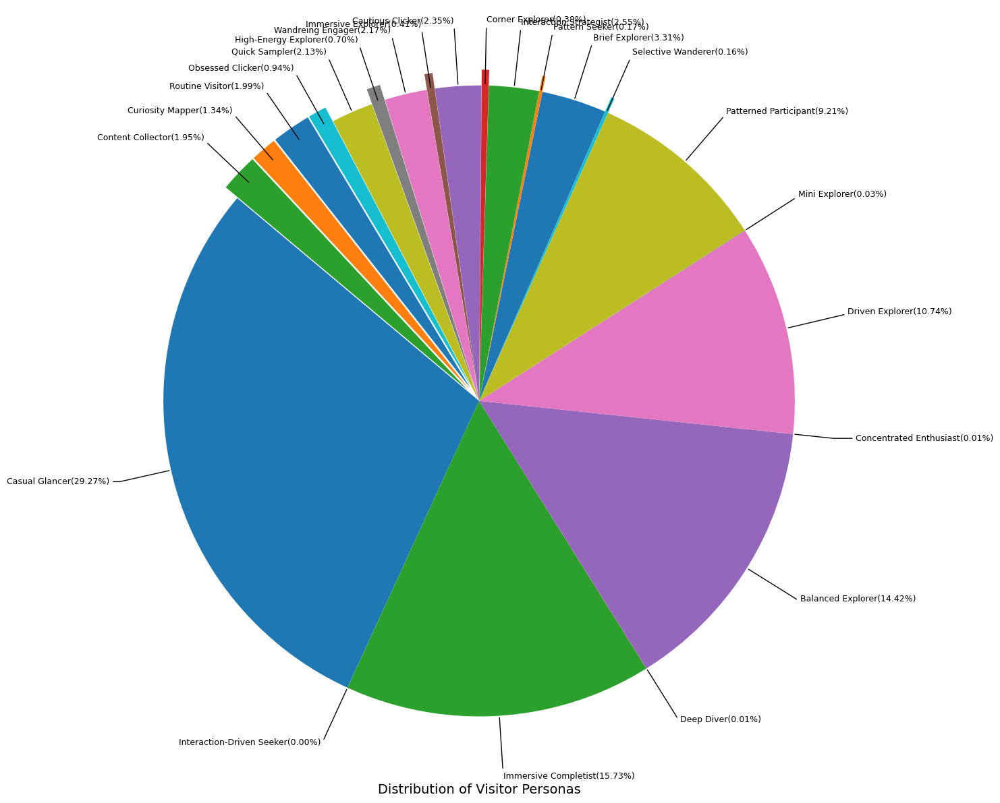

In [ ]:
#Pie Chart
reordered = []
left, right = 0, len(persona_summary_sorted) - 1
toggle = True
while left <= right:
    if toggle:
        reordered.append(persona_summary_sorted.iloc[left])
        left += 1
    else:
        reordered.append(persona_summary_sorted.iloc[right])
        right -= 1
    toggle = not toggle

reordered_df = pd.DataFrame(reordered)

explode = [0.05 if p < 2 else 0 for p in reordered_df['percentage']]

fig, ax = plt.subplots(figsize=(16, 12))

wedges, texts = ax.pie(
    reordered_df['visitor_count'],
    labels=None,
    startangle=140,
    explode=explode
)

for i, (wedge, pct, label) in enumerate(zip(wedges, reordered_df['percentage'], reordered_df['persona_name'])):
    angle = (wedge.theta2 + wedge.theta1) / 2
    x = np.cos(np.deg2rad(angle))
    y = np.sin(np.deg2rad(angle))
    horizontalalignment = 'left' if x > 0 else 'right'
    connectionstyle = "angle,angleA=0,angleB={}".format(angle)

    ax.annotate(
        f"{label}({pct:.2f}%)",
        xy=(x, y),
        xytext=(1.2 * x, 1.2 * y),
        horizontalalignment=horizontalalignment,
        arrowprops=dict(arrowstyle="-", connectionstyle=connectionstyle),
        fontsize=9
    )

ax.set_title("Distribution of Visitor Personas", fontsize=14, y=-0.005)
plt.tight_layout()
plt.show()

Radar Visualization for 24 visitor profiles

In [ ]:
# Aggregate averages for each of the 24 profile groups
radar_data = visitor_profiles.groupby('behavior_profile').agg({
    'total engagement times': 'mean',
    'total categories engaged': 'mean',
    'total installations engaged': 'mean'
}).round(2).sort_index()

radar_data

,total engagement times,total categories engaged,total installations engaged
behavior_profile,,,
High-High-High,31.54,7.48,19.56
High-High-Medium,22.24,7.10,12.56
High-Low-High,24.28,3.92,15.07
High-Low-Low,21.00,4.00,6.33
High-Low-Medium,22.10,3.76,11.90
High-Medium-High,25.83,5.71,16.45
High-Medium-Low,23.50,5.00,7.00
High-Medium-Medium,22.30,5.41,12.34
Low-High-Low,9.11,7.00,7.89


In [ ]:
radar_data.to_csv('/content/drive/MyDrive/radar_data', index=False)

In [ ]:
#create radar plots
import pandas as pd
import ast
import numpy as np
import matplotlib.pyplot as plt

#add persona name
radar_data_plots = radar_data.reset_index()
radar_data_plots['persona_name'] = radar_data_plots['behavior_profile'].map(lambda x: persona_mapping.get(x, (None,))[0])
radar_data_plots = radar_data_plots[radar_data_plots['persona_name'].notna()] #filter the undefined personas

#standardize values
columns_to_scale = ['total engagement times' , 'total categories engaged', 'total installations engaged']
radar_data_scaled = radar_data_plots.copy()
for col in columns_to_scale:
    radar_data_scaled[col] = radar_data_scaled[col] / radar_data_scaled[col].max()

#radar plots structures
labels = ['Total\nEngagement', 'Engaged\nCategories', 'Engaged\nInstallations']
angles = np.linspace(0, 2 * np.pi, len(labels), endpoint=False).tolist()
angles += angles[:1]


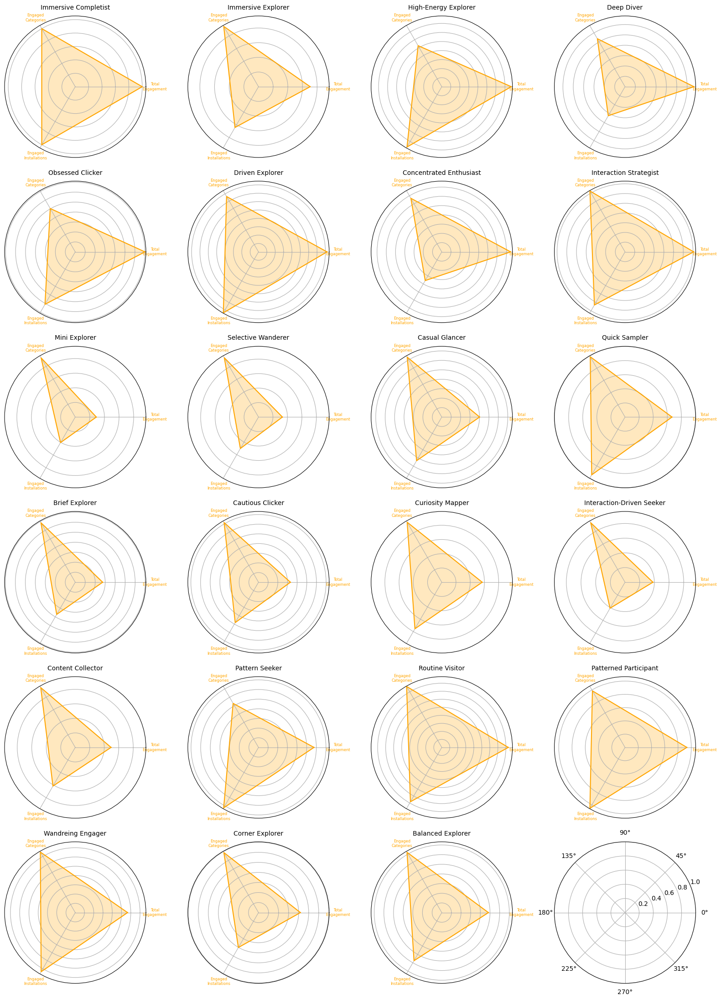

In [ ]:
values_list = []
names_list = []
for _, row in radar_data_scaled.iterrows():
    values = [
        row['total engagement times'],
        row['total categories engaged'],
        row['total installations engaged'],
    ]
    values += values[:1]
    values_list.append(values)
    names_list.append(row['persona_name'])

#create grid of radar charts (4*6)
fig, axes = plt.subplots(6, 4, figsize=(16, 22), subplot_kw=dict(polar=True))
axes = axes.flatten()
for i in range(len(axes)):
  ax = axes[i]
  if i < len(values_list):
    values = values_list[i]
    name = names_list[i]

    ax.plot(angles, values, label=name,color='orange')
    ax.fill(angles, values, alpha=0.25, color='orange')
    ax.set_title(name, fontsize=10, pad=10)
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(labels, fontsize=6, color='orange')
    ax.set_yticklabels([])
    ax.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
fig.savefig('my_radar_chart.png', dpi=300, bbox_inches='tight')

In [ ]:
color_discrete_map_1 = {
    "Immersive Completist": "#005AB5",
    "Casual Glancer": "#FFB000",
    "Deep Diver": "#2ca02c",
    "Balanced Explorer": "#d62728",
    "Driven Explorer": "#7E2F8E",
    "Curiosity Mapper": "#8c564b",
    "Pattern Seeker": "#E24A33",
    "Intensive Explorer": "#999999",
    "Interaction-Driven Seeker": "#bcbd22",
    "Mini Explorer": "#17becf",
    "High-Energy Explorer": "#1b9e77",
    "Concentrated Enthusiast": "#d95f02",
    "Wandreing Engager": "#00BFC4",
    "Content Collector": "#E76BF3",
    "Selective Wanderer": "#66a61e",
    "Patterned Participant": "#e6ab02",
    "Interaction Strategist": "#a6761d",
    "Cautious Clicker": "#585858",
    "Corner Explorer": "#F21A00",
    "Quick Sampler": "#F15854",
    "Obsessed Clicker": "#9e0142",
    "Brief Explorer": "#5e4fa2",
    "Routine Visitor": "#FDB462",
    "Immersive Explorer": "#A1D99B"
}


In [ ]:
import plotly.express as px
fig = px.scatter_3d(
    visitor_profiles,
    x='total engagement times',
    y='total categories engaged',
    z='total installations engaged',
    color='persona_name',
    hover_data=['visitor_id', 'behavior_profile'],
    title="3D Scatterplot of Visitor Behavior Profiles"
)

fig.update_layout(scene=dict(
    xaxis_title='Total Engagement',
    yaxis_title='Engaged Categories',
    zaxis_title='Installations Visited'
))

fig.show()

In [ ]:
import plotly.express as px

np.random.seed(42)
jittered = visitor_profiles.copy()
jittered['x_jitter'] = jittered['total engagement times'] + np.random.uniform(-0.4, 0.4, size=len(jittered))
jittered['y_jitter'] = jittered['total categories engaged'] + np.random.uniform(-0.4, 0.4, size=len(jittered))
jittered['z_jitter'] = jittered['total installations engaged'] + np.random.uniform(-0.4, 0.4, size=len(jittered))

fig = px.scatter_3d(
    jittered,
    x='x_jitter',
    y='y_jitter',
    z='z_jitter',
    color='persona_name',
    color_discrete_map=color_discrete_map_1,
    hover_data={
        'visitor_id': True,
        'persona_name': True,
        'behavior_profile': True,
        'total engagement times': True,
        'total categories engaged': True,
        'total installations engaged': True,
        'x_jitter': False,
        'y_jitter': False,
        'z_jitter': False
    },
    title="3D Scatterplot of Visitor Behavior Profiles"
)

fig.update_layout(scene=dict(
    xaxis_title='Total Engagement',
    yaxis_title='Engaged Categories',
    zaxis_title='Installations Visited'
))

fig.show()

In [ ]:
fig.write_html("3d_scatter.html")